In [1]:
# if you are in folder experiments, uncomment and run this ones

In [2]:
%cd ..

/home/g/GitHub/annealed


In [3]:
import os
import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False
if IN_COLAB:
    print('we are in colab')
    !python -m pip install --upgrade -q git+https://github.com/alexey-pronkin/annealed@master
else:
    print('we are not in colab')
    !python -m pip uninstall avo -y
    !python 'setup.py' install

we are not in colab
/home/g/miniconda3/envs/annealed/lib/python3.7/distutils/dist.py:274: UserWarning: Unknown distribution option: 'install_requires'
  warnings.warn(msg)
running install
running build
running build_py
copying avo/toy_dist.py -> build/lib/avo
copying avo/models/vae_decoder.py -> build/lib/avo/models
copying avo/models/vae_gaussian.py -> build/lib/avo/models
copying avo/models/nflows.py -> build/lib/avo/models
copying avo/models/vae_encoder.py -> build/lib/avo/models
copying avo/models/vae_hvi.py -> build/lib/avo/models
copying avo/models/vae.py -> build/lib/avo/models
copying avo/models/vae_hvi_avo.py -> build/lib/avo/models
copying avo/models/hvi_avo.py -> build/lib/avo/models
running install_lib
creating /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo
creating /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/avo/models/vae_decoder.py -> /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
co

In [4]:
import avo

In [5]:
if IN_COLAB:
    %load_ext tensorboard
    %tensorboard --logdir lightning_logs
else:
    %load_ext tensorboard
    %tensorboard --logdir lightning_logs

Reusing TensorBoard on port 6007 (pid 34880), started 4:48:56 ago. (Use '!kill 34880' to kill it.)

In [6]:
from avo.toy_dist import targets as toy_targets
from avo.toy_dist import anntargets

In [7]:
from avo.toy_dist import PickleRick, ThreeMixture, SimpleNormal, MixtureTarget, DFunction

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from collections import OrderedDict
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [17]:
global_bounds = ((-3, 3), (-3, 3))

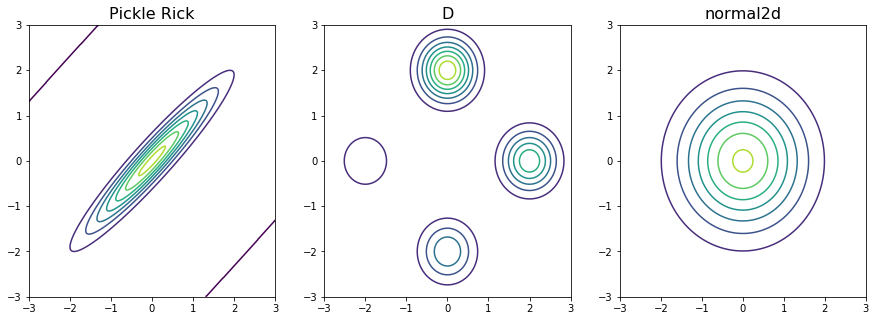

In [18]:
target_names = ['pickle2d', 'mixture2d', 'normal2d']
fig, ax = plt.subplots(ncols=len(target_names), figsize= (15,5))
targets = OrderedDict()

for i, t_name in enumerate(target_names):
    if t_name == 'pickle2d':
        L_target = torch.cholesky(torch.Tensor([[1., 0.95], [0.95, 1.]]))
        target = PickleRick(torch.Tensor([0., 0.]).unsqueeze(0).to(device), L_target.to(device)) 
    elif t_name == 'mixture2d':
        target = DFunction(device)
    elif t_name == 'normal2d':
        target = SimpleNormal(device)
    target.plot2d_pdf(ax[i], bounds=global_bounds)
    targets[t_name] = target

# NF HVI AVO

In [20]:
from avo.models import HVIAVO, HVIELBO, IAFELBO, IAFAVO, HouseholderELBO, HouseholderAVO
import pytorch_lightning as pl
import torch.nn as nn
from itertools import product

In [ ]:
# toy_targets = [
#     MixtureTarget(target1=targets[0], target2=targets[1], alpha = 0.7), 
#     DFunction(device=device)
# ]

In [21]:
models_classes = [
    HVIELBO,
    IAFELBO,
    HouseholderELBO,
    HVIAVO, 
    IAFAVO, 
    HouseholderAVO, 
]

In [22]:
targets

OrderedDict([('pickle2d', <avo.toy_dist.PickleRick at 0x7f352da83b10>),
             ('mixture2d', <avo.toy_dist.DFunction at 0x7f352d9cb1d0>),
             ('normal2d', <avo.toy_dist.SimpleNormal at 0x7f352d9e9b50>)])

In [23]:
def make_models(targets):
    models = OrderedDict()
    for d_name, d  in targets.items():
        models[d_name +'&'+ HVIELBO.__name__] = HVIELBO(input_dimension=2, depth=4, hidden_dimension=32, target=d, batch_size=128)
        models[d_name +'&'+ IAFELBO.__name__] = IAFELBO(input_dimension=2, depth=3, AR_dimensions=[32, 32], target=d, activation='ReLU', batch_size=128)
    #     models[d_name +'&'+ HouseholderELBO.__name__] = HouseholderELBO(input_dimension=2, batch_size=128, target=d, depth=5)
        models[d_name +'&'+ HVIAVO.__name__] = HVIAVO(input_dimension=2, depth=4, hidden_dimension=32, target=d, batch_size=128)
        models[d_name +'&'+ IAFAVO.__name__] = IAFAVO(input_dimension=2, depth=3, AR_dimensions=[32, 32], target=d, activation='ReLU', batch_size=128)
    #     models[d_name + HouseholderAVO.__name__] = HouseholderAVO(input_dimension=2, batch_size=128, target=d, depth=5)
    return models

In [24]:
def train_evaluate(models):
    traines = {}
    for model_name, model in models.items():
        traines[model_name] = pl.Trainer(max_epochs=2, max_steps = 3000, progress_bar_refresh_rate=10)
        traines[model_name].fit(model, model.data_loader(iteration_count=5000));
    for t, m in zip(traines.items(), models.items()):
        t_name, trainer = t
        model_name, model = m
        trainer.test(model, model.data_loader(500))
    return traines

In [25]:
# z = torch.randn((1, 2), device=device)
# models['mixture2d'].forward(z)
# log_prob = torch.sum(torch.distributions.normal.Normal(0, 1).log_prob(z), dim=1)
# mu, sigma = models['mixture2d']._transitions[0]._alpha
# print(mu)
# print(sigma)
# _, z, log_prob = models['mixture2d']._transitions[1](z, log_prob)
# _, z, log_prob = models['mixture2d']._transitions[2](z, log_prob)
# _, z, log_prob = models['mixture2d']._transitions[3](z, log_prob)
# _, z, log_prob = models['mixture2d']._transitions[4](z, log_prob)

In [38]:
def plot_results(models, targets):
    n_rows = len(models)//len(targets) # 4
    n_cols = len(targets) # 3
    fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(6*n_cols,6*n_rows), dpi= 240)
    target_names = list(targets.keys())
    for i, m in enumerate(models.items()):
        model_name, model = m
        model.to(device)
        sample_points = model.sample(100000).cpu().detach().numpy()
        ax[i%n_rows, i//n_rows].hist2d(sample_points[:, 0], sample_points[:, 1],  bins=(200, 200), cmap=plt.cm.Reds)
        targets[model_name.split('&')[0]].plot2d_pdf(ax[i%n_rows, i//n_rows], bounds=global_bounds)
        ax[i%n_rows, i//n_rows].set_ylabel(model_name.split('&')[1], fontsize=14)
    return fig, ax

In [62]:
def plot_results_t(models, targets):
    n_rows = len(models)//len(targets) # 4
    n_cols = len(targets) # 3
    fig, ax = plt.subplots(nrows=n_cols, ncols=n_rows, figsize=(5*n_rows, 5*n_cols), dpi= 240)
    target_names = list(targets.keys())
    for i, m in enumerate(models.items()):
        model_name, model = m
        model.to(device)
        sample_points = model.sample(100000).cpu().detach().numpy()
        ax[i//n_rows, i%n_rows].hist2d(sample_points[:, 0], sample_points[:, 1],  bins=(200, 200), cmap=plt.cm.Reds)
        targets[model_name.split('&')[0]].plot2d_pdf(ax[i//n_rows, i%n_rows], bounds=global_bounds)
        ax[i//n_rows, i%n_rows].set_ylabel(model_name.split('&')[1], fontsize=14)
    return fig, ax

In [28]:
models = make_models(targets)
trainers = train_evaluate(models)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9803), 'entropy': tensor(-1.6496), 'loss': tensor(-0.6693)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9946), 'entropy': tensor(-0.6657), 'loss': tensor(0.3289)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8835), 'entropy': tensor(-1.4788), 'loss': tensor(-0.5954)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.0000), 'entropy': tensor(-1.6456), 'loss': tensor(-0.6456)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.7223), 'entropy': tensor(-2.2178), 'loss': tensor(0.5045)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.9066), 'entropy': tensor(0.3758), 'loss': tensor(3.2824)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(3.0275), 'entropy': tensor(-2.7651), 'loss': tensor(0.2625)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(4.2454), 'entropy': tensor(-0.6313), 'loss': tensor(3.6142)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9866), 'entropy': tensor(-2.8242), 'loss': tensor(-1.8376)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9854), 'entropy': tensor(-1.8376), 'loss': tensor(-0.8522)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9494), 'entropy': tensor(-2.7797), 'loss': tensor(-1.8303)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9608), 'entropy': tensor(-2.7807), 'loss': tensor(-1.8199)}
--------------------------------------------------------------------------------



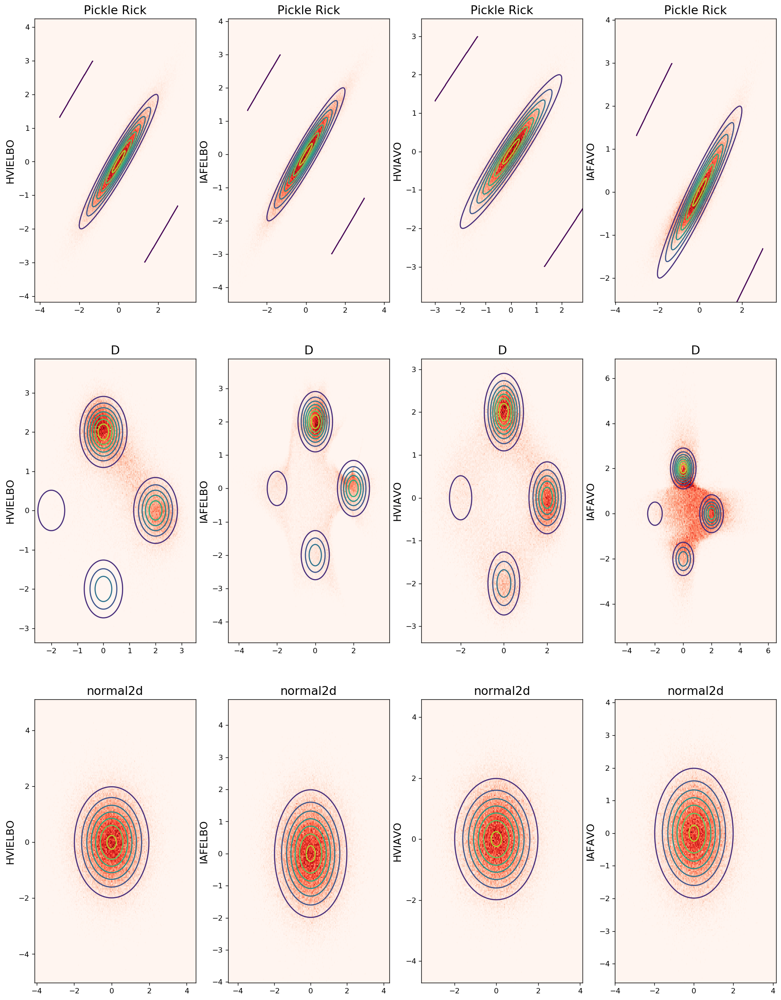

In [40]:
fig, axs = plot_results_t(models, targets)

In [41]:
fig.savefig('nfows_d.png', transparent=True)

In [42]:
for model_name, model in models.items():
    torch.save(obj=model.state_dict(), f='./pretrained_models/'+str(model_name)+'.pt')

In [43]:
toy_targets

In [44]:
targets_toy = {d.name:d for d in toy_targets}

In [45]:
targets_toy

{'toy dist a': <avo.toy_dist.ToyA at 0x7f353126cad0>,
 'toy dist b': <avo.toy_dist.ToyB at 0x7f353126cb10>,
 'toy dist c': <avo.toy_dist.ToyC at 0x7f353126cb50>,
 'toy dist d': <avo.toy_dist.ToyD at 0x7f353126cb90>,
 'toy dist e': <avo.toy_dist.ToyE at 0x7f353126cbd0>,
 'toy dist f': <avo.toy_dist.ToyF at 0x7f353126cc10>}

In [46]:
models_toy = make_models(targets_toy)
trainers_toy = train_evaluate(models_toy)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.7998), 'entropy': tensor(-1.8473), 'loss': tensor(-1.0476)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8473), 'entropy': tensor(-1.7143), 'loss': tensor(-0.8670)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.5147), 'entropy': tensor(-2.9793), 'loss': tensor(-1.4646)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(4.5930), 'entropy': tensor(-0.7479), 'loss': tensor(3.8451)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.4041), 'entropy': tensor(-4.5894), 'loss': tensor(-3.1853)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.7157), 'entropy': tensor(-3.3392), 'loss': tensor(-2.6234)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.3241), 'entropy': tensor(-4.6363), 'loss': tensor(-3.3123)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.9730), 'entropy': tensor(-2.6259), 'loss': tensor(-0.6529)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8299), 'entropy': tensor(-4.1060), 'loss': tensor(-3.2761)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9806), 'entropy': tensor(-3.0900), 'loss': tensor(-2.1094)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.6211), 'entropy': tensor(-4.0106), 'loss': tensor(-3.3895)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.0171), 'entropy': tensor(-3.3803), 'loss': tensor(-2.3633)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.1734), 'entropy': tensor(-1.2592), 'loss': tensor(0.9143)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(3.0207), 'entropy': tensor(0.5652), 'loss': tensor(3.5859)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(3.1636), 'entropy': tensor(-2.8584), 'loss': tensor(0.3052)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(4.4238), 'entropy': tensor(-0.5890), 'loss': tensor(3.8348)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8543), 'entropy': tensor(-1.9063), 'loss': tensor(-1.0519)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9085), 'entropy': tensor(-1.1006), 'loss': tensor(-0.1921)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8028), 'entropy': tensor(-2.0377), 'loss': tensor(-1.2349)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8285), 'entropy': tensor(-2.3121), 'loss': tensor(-1.4836)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.3092), 'entropy': tensor(-2.0392), 'loss': tensor(-1.7300)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.2980), 'entropy': tensor(-2.0096), 'loss': tensor(-1.7116)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.5077), 'entropy': tensor(-2.0712), 'loss': tensor(-1.5635)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8201), 'entropy': tensor(-2.5281), 'loss': tensor(-1.7081)}
--------------------------------------------------------------------------------



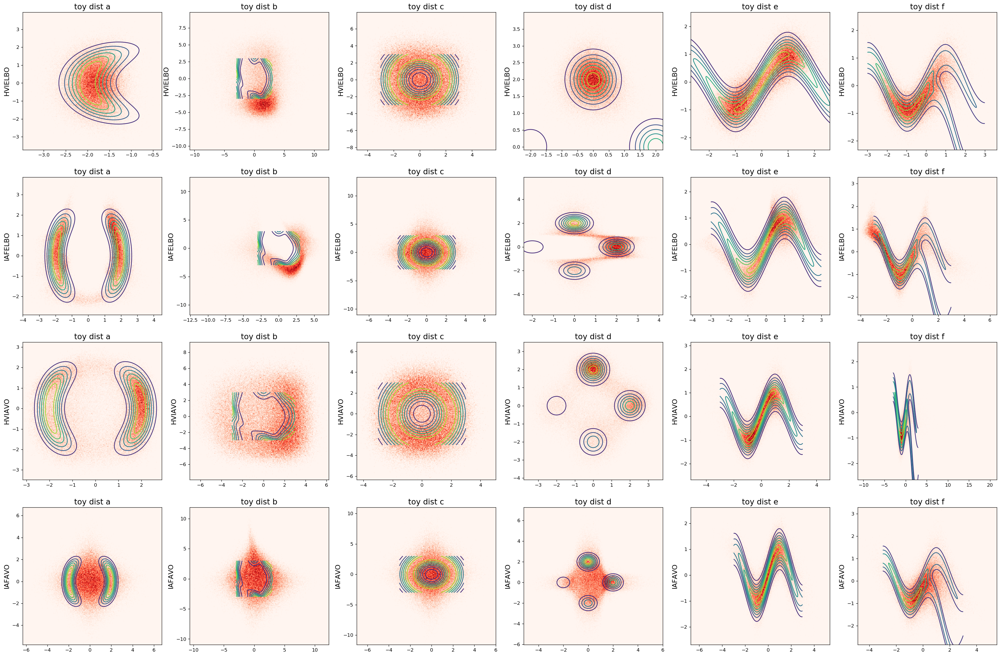

In [53]:
fig_toy, axs_toy = plot_results(models_toy, targets_toy)

In [54]:
fig_toy.savefig('toy_figs_presentation.png', transparent=True)

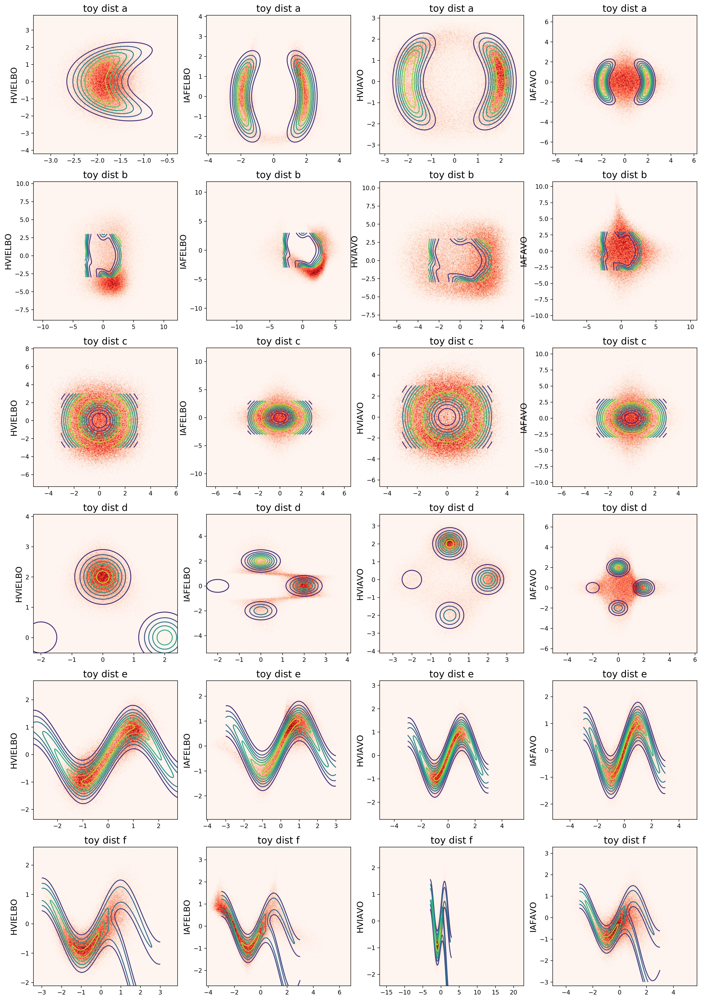

In [63]:
fig_toy_t, axs_toy_t = plot_results_t(models_toy, targets_toy)

In [64]:
fig_toy_t.savefig('toy_figs.png', transparent=True)

In [57]:
for model_name, model in models_toy.items():
    torch.save(obj=model.state_dict(), f='./pretrained_models/'+str(model_name)+'.pt')

In [58]:
import torch

dummy_input = torch.randn(1, 2, device=device)
# model = models['pickle2d&HVIELBO'].to(device)

# # Providing input and output names sets the display names for values
# # within the model's graph. Setting these does not change the semantics
# # of the graph; it is only for readability.
# #
# # The inputs to the network consist of the flat list of inputs (i.e.
# # the values you would pass to the forward() method) followed by the
# # flat list of parameters. You can partially specify names, i.e. provide
# # a list here shorter than the number of inputs to the model, and we will
# # only set that subset of names, starting from the beginning.
# input_names = [ "input_distribution" ]
# output_names = [ "output_distribution" ]

# torch.onnx.export(model, dummy_input, './pretrained_models/pickle2d&HVIELBO.onnx', verbose=True, input_names=input_names, output_names=output_names)

In [59]:
for model_name, model in models.items():
    traced = torch.jit.trace(model, dummy_input)
    traced.save('./pretrained_models/traced_'+str(model_name)+'.pth')
    torch.save(obj=model.state_dict(), f='./pretrained_models/'+str(model_name)+'.pt')

for model_name, model in models_toy.items():
    traced = torch.jit.trace(model, dummy_input)
    traced.save('./pretrained_models/traced_'+str(model_name)+'.pth')
    torch.save(obj=model.state_dict(), f='./pretrained_models/'+str(model_name)+'.pt')


/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 2 element(s) (out of 2) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 0.8339208662509918 (1.0565824508666992 vs. 0.2226615846157074), which occurred at index (0, 0).
  check_tolerance, strict, _force_outplace, True, _module_class)
/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 2. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 1 element(s) (out of 1) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 0.09498083591461182 (-0.746524453163147 vs. -0.651543617248

/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 2 element(s) (out of 2) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 0.3540491759777069 (0.3376409113407135 vs. 0.6916900873184204), which occurred at index (0, 1).
  check_tolerance, strict, _force_outplace, True, _module_class)
/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 2. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 1 element(s) (out of 1) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 0.17393314838409424 (-1.0352603197097778 vs. -0.86132717132

/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 2 element(s) (out of 2) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 0.4287717342376709 (-0.8215274810791016 vs. -1.2502992153167725), which occurred at index (0, 1).
  check_tolerance, strict, _force_outplace, True, _module_class)
/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 2. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 1 element(s) (out of 1) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 0.44149768352508545 (-1.1239042282104492 vs. -1.565401911